In [1]:
# # Colab warns and provides remediation steps if the GPUs is not compatible with RAPIDS.
# 
# !git clone https://github.com/rapidsai/rapidsai-csp-utils.git
# !python rapidsai-csp-utils/colab/pip-install.py

In [2]:
import pandas as pd

from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from joblib import Parallel, delayed

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

from pycaret.anomaly import setup, create_model, assign_model

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.image as mpimg

# Análise exploratória

In [3]:
# Lendo todos os arquivos CSV em DataFrames separados
df1 = pd.read_csv('../rio_vacaciones_api/data/1RioSeptember2023/listings.csv')
df2 = pd.read_csv('../rio_vacaciones_api/data/2RioDecember2023/listings.csv')
df3 = pd.read_csv('../rio_vacaciones_api/data/3RioMarch2024/listings.csv')
df4 = pd.read_csv('../rio_vacaciones_api/data/4RioJune2024/listings.csv')

# Concatenando todos os DataFrames em um único
df = pd.concat([df1, df2, df3, df4], ignore_index=True)

# Convertendo as colunas de data para datetime
df['last_scraped'] = pd.to_datetime(df['last_scraped'])
df['calendar_last_scraped'] = pd.to_datetime(df['calendar_last_scraped'])

# Exibindo as estatísticas resumidas transpostas
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,140665.0,4.682075e+17,4.544624e+17,1.787800e+04,2.998775e+07,6.093853e+17,9.051832e+17,1.187209e+18
scrape_id,140665.0,2.023593e+13,4.693838e+09,2.023092e+13,2.023123e+13,2.024033e+13,2.024033e+13,2.024063e+13
host_id,140665.0,1.834955e+08,1.807894e+08,1.671000e+03,2.487564e+07,1.020022e+08,3.370793e+08,5.856746e+08
host_listings_count,140650.0,1.698916e+01,9.404857e+01,1.000000e+00,1.000000e+00,2.000000e+00,6.000000e+00,2.637000e+03
host_total_listings_count,140650.0,2.838696e+01,1.425553e+02,1.000000e+00,1.000000e+00,3.000000e+00,8.000000e+00,6.430000e+03
neighbourhood_group_cleansed,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,140665.0,-2.296747e+01,3.490573e-02,-2.307328e+01,-2.298471e+01,-2.297281e+01,-2.295595e+01,-2.274969e+01
longitude,140665.0,-4.324970e+01,9.968675e-02,-4.372301e+01,-4.330705e+01,-4.319482e+01,-4.318559e+01,-4.310440e+01
accommodates,140665.0,4.045676e+00,2.354326e+00,1.000000e+00,2.000000e+00,4.000000e+00,5.000000e+00,1.600000e+01
bathrooms,67732.0,1.561921e+00,1.008507e+00,0.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,3.000000e+01


In [46]:
del df1
del df2
del df3
del df4

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140665 entries, 0 to 140664
Data columns (total 75 columns):
 #   Column                                        Non-Null Count   Dtype         
---  ------                                        --------------   -----         
 0   id                                            140665 non-null  int64         
 1   listing_url                                   140665 non-null  object        
 2   scrape_id                                     140665 non-null  int64         
 3   last_scraped                                  140665 non-null  datetime64[ns]
 4   source                                        140665 non-null  object        
 5   name                                          140665 non-null  object        
 6   description                                   101643 non-null  object        
 7   neighborhood_overview                         70442 non-null   object        
 8   picture_url                                   140665 n

In [5]:
df.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,231497,https://www.airbnb.com/rooms/231497,20230922043705,2023-09-22,city scrape,Rental unit in Rio de Janeiro · ★4.73 · 1 bedr...,"This is a big studio at the end of Copacabana,...",NaN,https://a0.muscache.com/pictures/3582382/ee8ac...,1207700,...,4.92,4.90,4.65,NaN,f,4,4,0,0,0.54
1,231516,https://www.airbnb.com/rooms/231516,20230922043705,2023-09-22,city scrape,Rental unit in Rio de Janeiro · ★4.71 · 1 bedr...,"Special location of the building, on Copacaban...",NaN,https://a0.muscache.com/pictures/3671683/d74b4...,1207700,...,4.86,4.93,4.38,NaN,f,4,4,0,0,0.20
2,236991,https://www.airbnb.com/rooms/236991,20230922043705,2023-09-23,city scrape,Rental unit in Rio de Janeiro · ★4.89 · 1 bedr...,"Aconchegante, amplo, básico, arejado, iluminad...","Copacabana, apelidada a princesinha do mar, fa...",https://a0.muscache.com/pictures/5725a59b-147d...,1241662,...,4.96,4.99,4.89,NaN,f,2,2,0,0,0.65
3,17878,https://www.airbnb.com/rooms/17878,20230922043705,2023-09-23,city scrape,Condo in Rio de Janeiro · ★4.70 · 2 bedrooms ·...,Please note that elevated rates applies for Ne...,This is the one of the bests spots in Rio. Bec...,https://a0.muscache.com/pictures/65320518/3069...,68997,...,4.91,4.77,4.67,NaN,f,1,1,0,0,1.87
4,25026,https://www.airbnb.com/rooms/25026,20230922043705,2023-09-22,city scrape,Rental unit in Rio de Janeiro · ★4.71 · 1 bedr...,"**Fully renovated in Dec 2022, new kitchen, n...",Copacabana is a lively neighborhood and the ap...,https://a0.muscache.com/pictures/a745aa21-b8dd...,102840,...,4.92,4.84,4.59,NaN,f,1,1,0,0,1.68


# Data preprocessing
## (tratamento de dados)

### Limpeza de dados

In [6]:
# Remover linhas com valores nulos de preços e banheiros. Banheiros é útil para definir a chiqueza do imóvel.
df = df.dropna(subset=['price', 'bathrooms'])

In [7]:
# Manter só 'price', 'bathrooms', 'latitude', 'longitude' e 'room_type', price no final
df = df[['latitude', 'longitude', 'bathrooms', 'room_type','price']]

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67577 entries, 67972 to 140664
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   latitude   67577 non-null  float64
 1   longitude  67577 non-null  float64
 2   bathrooms  67577 non-null  float64
 3   room_type  67577 non-null  object 
 4   price      67577 non-null  object 
dtypes: float64(3), object(2)
memory usage: 3.1+ MB


### Transformação de dados

In [9]:
# Limpar a coluna de preço
df.price = df.price.str.replace('$', '').str.replace(',', '').astype(float)

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67577 entries, 67972 to 140664
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   latitude   67577 non-null  float64
 1   longitude  67577 non-null  float64
 2   bathrooms  67577 non-null  float64
 3   room_type  67577 non-null  object 
 4   price      67577 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.1+ MB


In [10]:
# Transformar a coluna de tipo de quarto em categórica
df.room_type = df.room_type.astype('category')

df['room_type'].value_counts()

Entire home/apt    53450
Private room       12860
Shared room         1221
Hotel room            46
Name: room_type, dtype: int64

In [11]:
# Removemos "room_type" pela quantidade de valores de "entire home/apt". Parece ser o 'default' do Airbnb, e que os usuários não se importam muito com isso. Número de banheiros é mais seguro.
df = df.drop(columns=['room_type'])

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,67577.0,-22.967776,0.034560,-23.073276,-22.98469,-22.972996,-22.956650,-22.74995
longitude,67577.0,-43.248693,0.099611,-43.723009,-43.30345,-43.194384,-43.185425,-43.10440
bathrooms,67577.0,1.562033,1.008788,0.000000,1.00000,1.000000,2.000000,30.00000
price,67577.0,739.059547,5690.312269,0.000000,200.00000,320.000000,597.000000,633125.00000


In [13]:
# Remove números irrealistas de banheiros
df = df[df.bathrooms < 16]
df = df[df.price > 0]

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67563 entries, 67972 to 140664
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   latitude   67563 non-null  float64
 1   longitude  67563 non-null  float64
 2   bathrooms  67563 non-null  float64
 3   price      67563 non-null  float64
dtypes: float64(4)
memory usage: 2.6 MB


In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,67563.0,-22.967772,0.034559,-23.073276,-22.984690,-22.972996,-22.956634,-22.74995
longitude,67563.0,-43.248666,0.099573,-43.723009,-43.303443,-43.194381,-43.185428,-43.10440
bathrooms,67563.0,1.558864,0.979663,0.000000,1.000000,1.000000,2.000000,15.50000
price,67563.0,739.089502,5690.893632,33.000000,200.000000,320.000000,597.000000,633125.00000


### Normalização

In [15]:
scaler = StandardScaler()

df[['latitude', 'longitude', 'bathrooms']] = scaler.fit_transform(df[['latitude', 'longitude', 'bathrooms']])

mean_price = df['price'].mean()
std_price = df['price'].std()

df['price'] = (df['price'] - mean_price) / std_price

df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,67563.0,-1.408781e-14,1.000007,-3.052897,-0.489546,-0.151169,0.322282,6.302962
longitude,67563.0,5.491212e-14,1.000007,-4.763793,-0.550119,0.545179,0.635102,1.448857
bathrooms,67563.0,5.468707e-17,1.000007,-1.591236,-0.570469,-0.570469,0.450297,14.230651
price,67563.0,-7.992725e-18,1.000000,-0.124074,-0.094728,-0.073642,-0.024968,111.122427


# Clusterizando e detectando anomalias nos preços do Airbnb
## Objetivo
Vamos clusterizar os dados baseados em latitude, longitude e número de banheiros. Após a clusterização, vamos detectar anomalias de preço dentro de cada cluster. O objetivo é identificar propriedades que são outliers dentro de seu cluster, sem classificar propriedades de alto padrão como anomalias.

In [16]:
# Preparo dos dados para clusterização
X = df[['latitude', 'longitude', 'bathrooms', 'price']]

In [17]:
# # Função para calcular a SSE para um número de clusters específico
# def calculate_sse(n_clusters, X):
#     kmeans = KMeans(n_clusters=n_clusters, random_state=0)
#     kmeans.fit(X)
#     sse = kmeans.inertia_  # SSE (Sum of Squared Errors)
#     return n_clusters, sse
# 
# # Definindo o intervalo de clusters para testar
# range_n_clusters = range(1, 163)
# 
# # Para reduzir o uso de memória, vamos estabelecer batches
# batch_size = 54  # Ajustável conforme a necessidade
# 
# results = [
#     result for i in range(0, len(range_n_clusters), batch_size)
#     for result in Parallel(n_jobs=6)(delayed(calculate_sse)(n, X) for n in range_n_clusters[i:i + batch_size])
# ]
# 
# # Convertendo os resultados para duas listas separadas
# n_clusters_list, sse_list = zip(*results)

# cell execution time: 7min 16s in an Acer Aspire VX15 with an Intel Core i7-7700HQ and 16GB of RAM

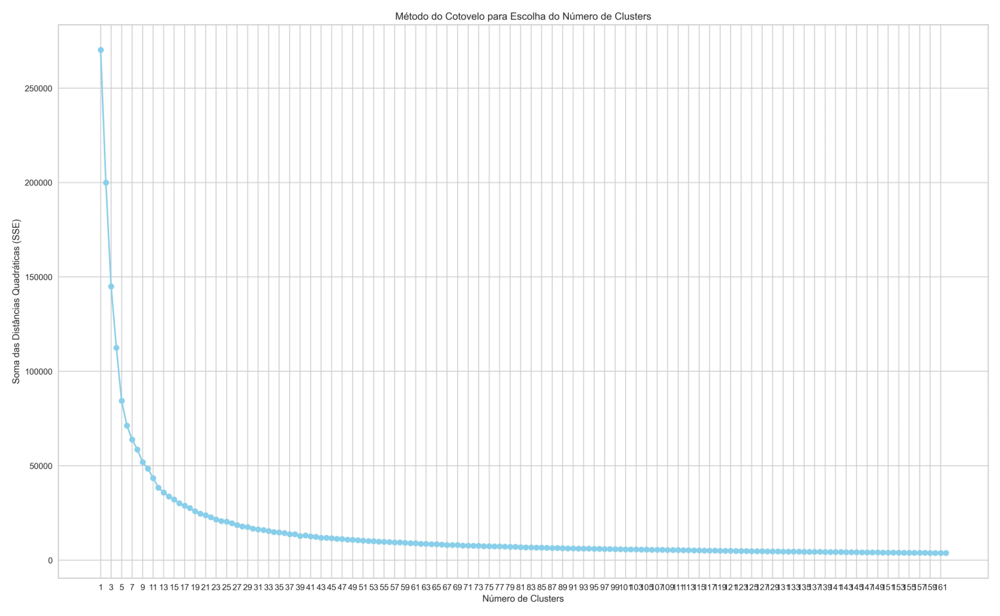

In [18]:
# # Plotando O método do cotovelo
# plt.figure(figsize=(20, 12))
# plt.plot(n_clusters_list, sse_list, marker='o', linestyle='-', color='skyblue')
# 
# plt.plot(n_clusters_list, sse_list, marker='o', linestyle='-', color='skyblue')
# 
# # Definindo manualmente as marcas do eixo x para mostrar pontos de dois em dois
# plt.xticks(range(min(n_clusters_list), max(n_clusters_list) + 1, 2))  # Define intervalo de 2
# 
# plt.xlabel('Número de Clusters')
# plt.ylabel('Soma das Distâncias Quadráticas (SSE)')
# plt.title('Método do Cotovelo para Escolha do Número de Clusters')
# 
# 
# # Salvando o gráfico gerado como um arquivo WEBP
# plt.savefig('cotovelo_plot.webp', format='webp', dpi=300, bbox_inches='tight')

# Carregando a imagem salva
img = mpimg.imread('cotovelo_plot.webp')

# Mostrando o gráfico salvo
plt.figure(figsize=(20, 12))
plt.imshow(img)
plt.axis('off')  # Esconde os eixos
plt.show()

In [19]:
# # Função para calcular a silhueta para um número de clusters específico
# def calculate_silhouette(n_clusters, X):
#     kmeans = KMeans(n_clusters=n_clusters, random_state=0)  # Paralelização no fit do KMeans
#     labels = kmeans.fit_predict(X)
#     if n_clusters > 1:
#         score = silhouette_score(X, labels)
#     else:
#         score = 0
#     return n_clusters, score
# 
# # Definindo o intervalo de clusters para testar
# range_n_clusters = range(1, 31)
# 
# # Para reduzir o uso de memória, vamos estabelecer batches
# batch_size = 15 # Ajustável conforme a necessidade
# 
# results = [
#     result for i in range(0, len(range_n_clusters), batch_size)
#     for result in Parallel(n_jobs=6)(delayed(calculate_silhouette)(n, X) for n in range_n_clusters[i:i + batch_size])
# ]
# 
# # Convertendo os resultados para duas listas separadas
# n_clusters_list, silhouette_scores = zip(*results)
# 
# # Melhor número de clusters baseado na silhueta
# best_n_clusters = n_clusters_list[silhouette_scores.index(max(silhouette_scores))]

# cell execution time: 18min 11s in an Acer Aspire VX15 with an Intel Core i7-7700HQ and 16GB of RAM

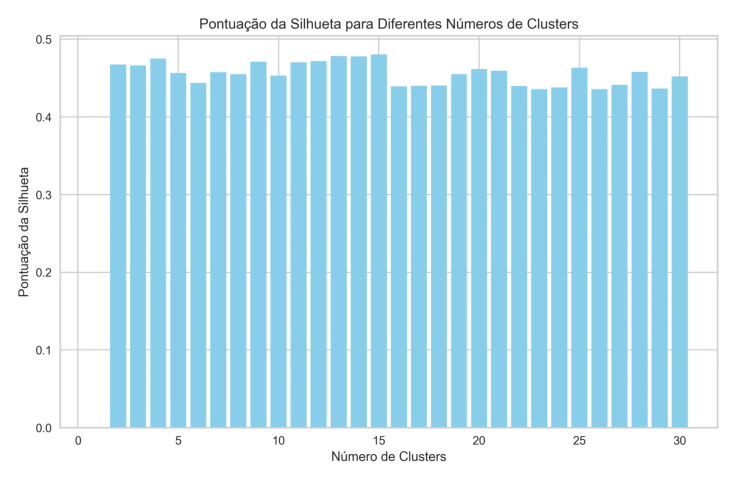

In [20]:
# # Plotando os resultados em um gráfico de barras
# plt.figure(figsize=(10, 6))
# plt.bar(n_clusters_list, silhouette_scores, color='skyblue')
# plt.xlabel('Número de Clusters')
# plt.ylabel('Pontuação da Silhueta')
# plt.title('Pontuação da Silhueta para Diferentes Números de Clusters')
# 
# # Salvando o gráfico gerado como um arquivo WEBP
# plt.savefig('silhouette_plot.webp', format='webp', dpi=300, bbox_inches='tight')

# Carregando a imagem salva
img = mpimg.imread('silhouette_plot.webp')

# Mostrando o gráfico salvo
plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis('off')  # Esconde os eixos
plt.show()

In [21]:
# best_n_clusters

# 15

In [22]:
best_n_clusters = 15

In [23]:
# Escolha do número de clusters
n_clusters = best_n_clusters  # Ajustável conforme a necessidade
kmeans = KMeans(n_clusters=n_clusters, random_state=0)

# Fit e predict
df['cluster_kmeans'] = kmeans.fit_predict(X)

# Verificando os clusters únicos
clusters_kmeans = df['cluster_kmeans'].unique()

best_n_clusters

15

In [24]:
df['cluster_kmeans'].value_counts()

7     22820
12    10600
0      9631
1      5293
13     5143
11     3763
2      3238
4      2624
5      2041
8       881
6       857
14      503
9       149
10       13
3         7
Name: cluster_kmeans, dtype: int64

In [ ]:
# Separação dos dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, df['cluster_kmeans'], test_size=0.42, random_state=0)

# Definindo o número de vizinhos
# (
#   com mais que 4 visinhos:
#       perdemos as anomalias de preços muito baixos {0~44 no PyCaret, 50~700 em nossa implementação}
#       e o número de clusteres vai para 13 ao invés de 14, distorcendo a clusterização com o KMeans
# )
n_neighbors = 4
knn = KNeighborsClassifier(n_neighbors=n_neighbors, n_jobs=-1)

# Treinando o modelo KNN
knn.fit(X_train, y_train)

In [ ]:
# Validação do modelo KNN
knn.score(X_test, y_test)

In [ ]:
# Previsão dos clusters usando KNN
df['cluster_knn'] = knn.predict(X)

# Verificando os clusters únicos previstos pelo KNN
clusters_knn = df['cluster_knn'].unique()

# Exibindo a contagem de cada cluster previsto pelo KNN
df['cluster_knn'].value_counts()

In [26]:
df[['latitude', 'longitude', 'bathrooms']] = scaler.inverse_transform(df[['latitude', 'longitude', 'bathrooms']])
df['price'] = df['price'] * std_price + mean_price

In [27]:
df['bathrooms'].value_counts()

1.0     39842
2.0     14162
1.5      4187
3.0      3248
2.5      2287
3.5       895
4.0       802
4.5       369
5.0       341
0.5       311
0.0       306
6.0       202
5.5       178
7.0       122
6.5       101
8.0        72
7.5        51
11.0       23
8.5        16
9.0        15
10.0       14
12.0        9
9.5         3
15.5        2
13.0        2
11.5        1
10.5        1
12.5        1
Name: bathrooms, dtype: int64

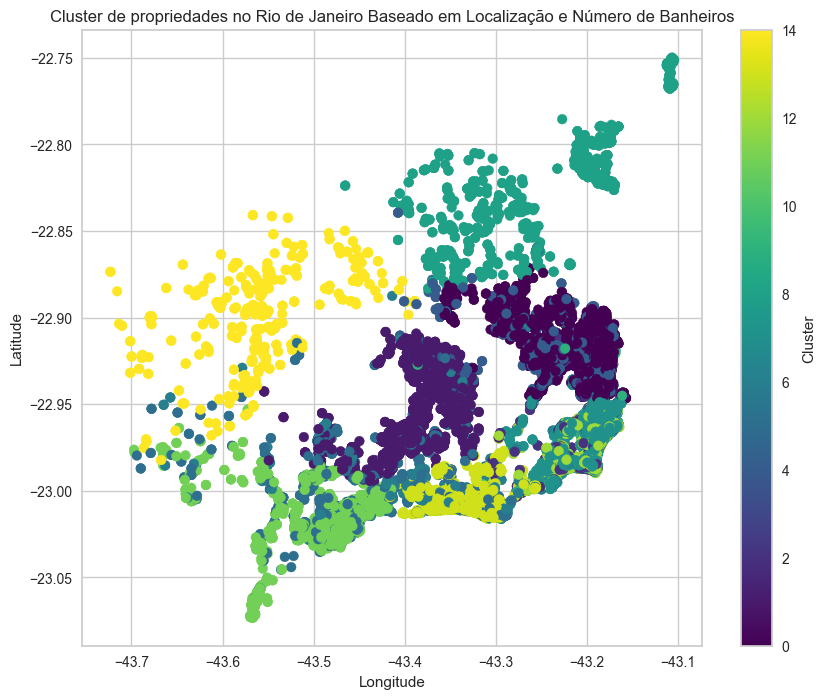

In [28]:
plt.figure(figsize=(10, 8))
plt.scatter(df['longitude'], df['latitude'], c=df['cluster_knn'], cmap='viridis')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Cluster de propriedades no Rio de Janeiro Baseado em Localização e Número de Banheiros')
plt.colorbar(label='Cluster')
plt.show()

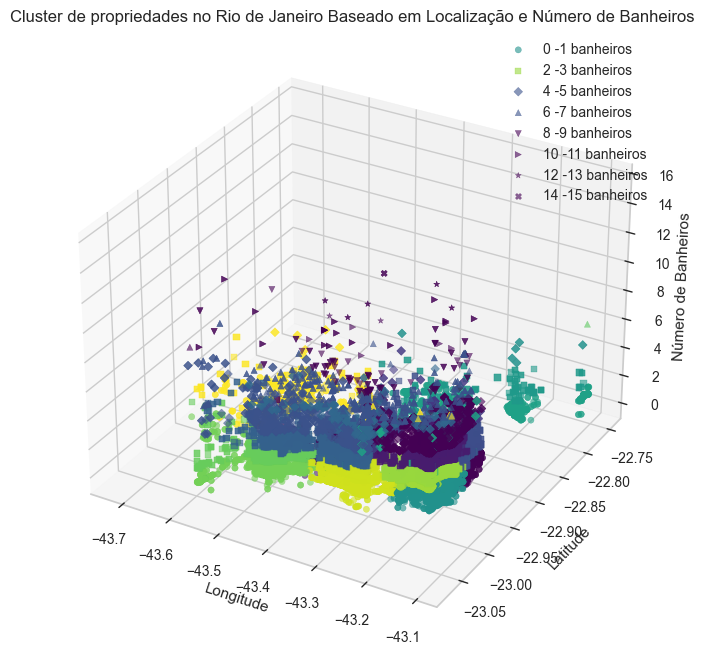

<Figure size 1000x600 with 0 Axes>

In [29]:
# Formas para número de banheiros
markers = {1: 'o', 2: 's', 3: 'D', 4: '^', 5: 'v', 6: '>', 7: '*', 8: 'X'}

# Adicionar 8 símbolos, 1 símbolo a cada 2 quantidades de banheiro
df['marker'] = df['bathrooms'].apply(lambda x: markers.get((x // 2) + 1, 'o'))

# Fazer um scatter plot 3D
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

plt.figure(figsize=(10, 6))
for marker, symbol in markers.items():
    subset = df[df['marker'] == symbol]
    ax.scatter(subset['longitude'], subset['latitude'], subset['bathrooms'], c=subset['cluster_knn'], marker=symbol, cmap='viridis', label=f'{(marker - 1)*2} -{(marker - 1)*2 + 1} banheiros', alpha=0.6)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Número de Banheiros')
ax.set_title('Cluster de propriedades no Rio de Janeiro Baseado em Localização e Número de Banheiros')
ax.legend(loc='best', fontsize='small')
plt.show()

In [30]:
# Formas para número de banheiros
markers = {1: 'circle', 2: 'square', 3: 'diamond', 4: 'cross', 5: 'x', 6: 'circle-open', 7: 'square-open', 8: 'diamond-open'}

# Adicionar 8 símbolos, 1 símbolo a cada 2 quantidades de banheiro
df['marker'] = df['bathrooms'].apply(lambda x: markers.get(((x - 1) // 2) + 1, 'circle'))

# Criando uma figura 3D com Plotly
fig = go.Figure()

# Iterando sobre cada marcador para adicionar ao gráfico
for marker, symbol in markers.items():
    subset = df[df['marker'] == symbol]
    fig.add_trace(go.Scatter3d(
        x=subset['longitude'],
        y=subset['latitude'],
        z=subset['bathrooms'],
        mode='markers',
        marker=dict(
            size=5,
            symbol=symbol,  # Usando símbolos de marcadores personalizados do Plotly
            color=subset['cluster_knn'],  # Cor representando o cluster
            colorscale='Viridis',
            opacity=0.6
        ),
        name=f'{(marker - 1)*2 + 1} -{(marker - 1)*2 + 2} banheiros'
    ))

# Configurações dos eixos e título
fig.update_layout(
    scene=dict(
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Número de Banheiros'
    ),
    title='Cluster 3D de Propriedades Baseado em Localização e Número de Banheiros',
    legend=dict(font=dict(size=10)),
    width=800,
    height=800
)

# Mostra o gráfico interativo
fig.show()

In [31]:
df.price.value_counts()

250.0      1463
300.0      1417
200.0      1345
500.0      1122
400.0      1121
           ... 
1703.0        1
1631.0        1
2344.0        1
10836.0       1
8571.0        1
Name: price, Length: 2540, dtype: int64

### Detectando anomalias de preços dentro dos clusteres

## Detecção de anomalia com clusteres

Agora que temos os clusters, vamos detectar anomalias de preço dentro de cada. Usaremos o Z-score para encontrar essas anomalias de cada cluster.

In [32]:
df[['latitude', 'longitude', 'bathrooms']] = scaler.transform(df[['latitude', 'longitude', 'bathrooms']])
df['price'] = (df['price'] - mean_price) / std_price

In [33]:
# Inicializa uma coluna para anomalias
df['anomaly'] = 0

# Detecta anomalias em cada cluster
for cluster in clusters_knn:
    cluster_data = df[df['cluster_knn'] == cluster]
    # Calcula o Z-score para o preço dentro do cluster
    cluster_data['cluster_price_zscore'] = (cluster_data['price'] - cluster_data['price'].mean()) / cluster_data['price'].std()
    # Define como anomalias as propriedades com um Z-score acima de 1 ou abaixo de -1
    df.loc[df['cluster_knn'] == cluster, 'anomaly'] = cluster_data['cluster_price_zscore'].apply(lambda x: 1 if abs(x) > 1 else 0)

## Explorando as anomalias

Vamos dar uma olhada nas anomalias que detectamos para posteriormente comparar com o PyCaret. Essas são propriedades dentro de cada cluster que têm preços significativamente mais altos ou mais baixos do que outros no mesmo grupo.


In [34]:
df[['latitude', 'longitude', 'bathrooms']] = scaler.inverse_transform(df[['latitude', 'longitude', 'bathrooms']])
df['price'] = df['price'] * std_price + mean_price

In [35]:
# Mostrar as anomalias
anomalies = df[df['anomaly'] == 1]
anomalies_info = anomalies[['cluster_knn', 'latitude', 'longitude', 'bathrooms', 'price']]
anomalies_info

,cluster_knn,latitude,longitude,bathrooms,price
67990,2,-22.986320,-43.229360,3.5,4998.0
68007,0,-22.912580,-43.189020,1.0,1000.0
68042,7,-22.963430,-43.190500,1.0,2678.0
68060,7,-22.982820,-43.189350,1.0,1490.0
68063,12,-22.982510,-43.221080,2.0,1688.0
...,...,...,...,...,...
140548,1,-22.969823,-43.392262,1.0,3000.0
140567,11,-23.031072,-43.477664,2.0,1592.0
140598,13,-22.998351,-43.256725,1.0,1400.0
140622,6,-23.001288,-43.275437,6.5,15000.0


In [36]:
anomalies_info.cluster_knn.value_counts()

7     1213
12     826
1      470
0      416
2      352
13     276
5      218
4      214
6      195
11     183
8       49
9       38
14      25
10       1
3        1
Name: cluster_knn, dtype: int64

In [37]:
anomalies_info.price.value_counts()

1000.0     232
1500.0     228
2000.0     206
1200.0     153
2500.0     110
          ... 
851.0        1
6426.0       1
13145.0      1
3525.0       1
2639.0       1
Name: price, Length: 1075, dtype: int64

In [38]:
anomalies_info.describe().T

,count,mean,std,min,25%,50%,75%,max
cluster_knn,4477.0,6.564887,4.311756,0.000000,2.000000,7.00000,12.000000,14.000000
latitude,4477.0,-22.970204,0.033355,-23.072840,-22.986000,-22.97539,-22.962550,-22.753294
longitude,4477.0,-43.253294,0.094263,-43.701218,-43.304602,-43.20490,-43.188772,-43.105930
bathrooms,4477.0,2.084878,1.542824,0.000000,1.000000,2.00000,2.500000,15.500000
price,4477.0,3424.817065,11694.700631,50.000000,1200.000000,1857.00000,3400.000000,633125.000000


## Considerando a detecção de anomalias do PyCaret

PyCaret é uma biblioteca de baixo código que pode simplificar o processo de detecção de anomalias. Embora seja frequentemente usado com dados de séries temporais, também pode ser aplicado ao nosso conjunto de dados não séries temporais. Vamos explorar brevemente como usar o PyCaret para detecção de anomalias para comparar com nosso método anterior.

In [39]:
df[['latitude', 'longitude', 'bathrooms']] = scaler.transform(df[['latitude', 'longitude', 'bathrooms']])
df['price'] = (df['price'] - mean_price) / std_price

In [40]:
# Configuração do PyCaret para detecção de anomalias
setup(df[['latitude', 'longitude', 'bathrooms', 'price']])

# Criar um modelo knn
model = create_model('knn')

# Designar anomalias ao dataframe
df_pycaret = assign_model(model)

# Adicionar preço e cluster de volta ao dataframe onde price é o mesmo que o dataframe original
df_pycaret['cluster_knn'] = df['cluster_knn']

,Description,Value
0,Session id,3900
1,Original data shape,"(67563, 4)"
2,Transformed data shape,"(67563, 4)"
3,Numeric features,4
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,CPU Jobs,-1
9,Use GPU,False


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,03:10:40
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


In [41]:
df[['latitude', 'longitude', 'bathrooms']] = scaler.inverse_transform(df[['latitude', 'longitude', 'bathrooms']])
df['price'] = df['price'] * std_price + mean_price
df_pycaret[['latitude', 'longitude', 'bathrooms']] = scaler.inverse_transform(df_pycaret[['latitude', 'longitude', 'bathrooms']])
df_pycaret['price'] = df_pycaret['price'] * std_price + mean_price

In [42]:
# Exibir as anomalias detectadas
df_pycaret[df_pycaret['Anomaly'] == 1][['cluster_knn', 'latitude', 'longitude', 'bathrooms', 'price']]

,cluster_knn,latitude,longitude,bathrooms,price
67974,13,-23.002911,-43.390862,1.5,230.0
67977,6,-23.013500,-43.287449,6.0,4000.0
67986,6,-22.985910,-43.203018,7.0,2468.0
67991,6,-23.004511,-43.308731,7.0,3500.0
68111,2,-22.921289,-43.181931,5.0,5874.0
...,...,...,...,...,...
140622,6,-23.001287,-43.275436,6.5,15000.0
140624,11,-23.020338,-43.457470,0.5,44.0
140630,6,-22.984329,-43.219688,5.5,2222.0
140655,5,-23.004971,-43.308491,4.0,800.0


In [43]:
df_pycaret[df_pycaret['Anomaly'] == 1]['cluster_knn'].value_counts()

6     724
5     690
2     397
4     216
14    210
8     189
1     180
11    175
9     155
13    127
0     116
12     98
7      84
10     12
3       6
Name: cluster_knn, dtype: int64

In [44]:
df_pycaret[df_pycaret['Anomaly'] == 1]['price'].value_counts()

5000.0     83
4000.0     79
1500.0     66
3000.0     66
2500.0     63
           ..
12576.0     1
1426.0      1
162.0       1
4350.0      1
8571.0      1
Name: price, Length: 1101, dtype: int64

In [45]:
df_pycaret[df_pycaret['Anomaly'] == 1][['cluster_knn', 'latitude', 'longitude', 'bathrooms', 'price']].describe().T

,count,mean,std,min,25%,50%,75%,max
cluster_knn,3379.0,6.202131,3.709833,0.000000e+00,4.000000,6.000000,8.000000,14.000000
latitude,3379.0,-22.964319,0.052546,-2.307284e+01,-23.001810,-22.980871,-22.935320,-22.753294
longitude,3379.0,-43.345219,0.131477,-4.372301e+01,-43.437344,-43.326313,-43.228882,-43.105797
bathrooms,3379.0,3.580349,2.214479,-6.065359e-08,2.000000,3.500000,5.000000,15.500000
price,3379.0,5548.578125,24837.095703,4.400000e+01,499.999969,2000.000000,4999.000000,633125.000000


# Análise de Resultados


## Introdução

O objetivo inicial deste projeto era desenvolver um modelo de detecção de anomalias em séries temporais, integrando dados sazonais e períodos de eventos para gerar alertas de outliers no mercado imobiliário do Rio de Janeiro. No entanto, durante a análise, percebemos que o dataset do [Inside Airbnb](https://insideairbnb.com/rio-de-janeiro/), utilizado para o estudo, não contém dados coletados diariamente. Em vez disso, as coletas são feitas em intervalos específicos, o que inviabiliza a aplicação de técnicas de análise de séries temporais de forma contínua.

Além disso, embora existam informações com datas dispersas, como as avaliações dos imóveis, estas não são relevantes para o objetivo de criar um "gerador de alerta de outliers". Diante disso, o escopo do projeto foi ajustado para focar na detecção de anomalias utilizando técnicas de clusterização aplicadas a dados não temporais, explorando algoritmos como KMeans e KNN.

A nova abordagem visa identificar anomalias em um conjunto de dados de imóveis localizados no Rio de Janeiro, analisando padrões de preços e características que se destacam dos demais. Para alcançar esse objetivo, realizamos uma análise exploratória e limpeza de dados, seguida pela aplicação de técnicas de machine learning, como KMeans para clusterização e KNN para detecção de anomalias. Os resultados obtidos foram comparados com a biblioteca PyCaret para validar a eficácia do método proposto.

## Análise Exploratória & Limpeza de Dados

A análise exploratória foi realizada para entender a distribuição dos dados e identificar possíveis problemas como dados faltantes ou valores atípicos. As colunas originais incluíam informações como localização (latitude e longitude), número de banheiros, preços, avaliações, disponibilidade, entre outros.

Identificamos que algumas colunas continham muitos valores nulos e que muitas das colunas restantes ou eram redundantes ou irrelevantes, ou continham problemas, como no caso do 'room_type', que foi removida por ser preenchida majoritariamente com o valor "entire home/apt", sugerindo ser o padrão do Airbnb. Isso indica que proprietários não alteram este valor para evitar a exclusão de seus imóveis dos principais filtros de busca, tornando-o pouco informativo para a análise. Com base na análise exploratória, decidimos manter apenas as colunas mais relevantes: `latitude`, `longitude`, `bathrooms` (número de banheiros) e `price` (preço).

## Clusterização

Utilizamos o método do cotovelo (Elbow Method) para determinar o número ideal de clusters para o algoritmo KMeans. Após a análise do gráfico do cotovelo, restringimos o escopo de valores para um intervalo apropriado e aplicamos o método da silhouette para refinar a escolha do número de clusters. O tempo de processamento desta pré-análise foi de aproximadamente **25 minutos**, com diferentes valores de K testados para encontrar o melhor agrupamento, e por fim determinamos que o número ideal de clusters seria **13**.

## Decisão de Treinamento do KNN com Base no KMeans

Optamos por treinar um modelo KNN com base nos resultados do KMeans, já que o PyCaret, utilizado para comparação, aceita o KNN como modelo de detecção de anomalias, mas não o KMeans. Ao realizar essa abordagem, garantimos uma base comparativa consistente entre os modelos, permitindo analisar a eficácia do KNN quando treinado a partir de agrupamentos pré-estabelecidos pelo KMeans.

## Uso do Z-Score

O Z-Score foi utilizado para padronizar os dados antes de aplicar o KMeans e KNN. Essa normalização ajudou a garantir que todas as variáveis contribuíssem igualmente para a análise de similaridade, evitando distorções causadas por diferenças de escala entre as variáveis. O Z-Score também foi utilizado para detectar anomalias nos preços, sendo um cálculo de Z-Score para cada cluster separadamente, permitindo identificar anomalias de preços dentro de cada grupo. A ideia é sugerir que em um bairro/região específica, um preço muito alto ou muito baixo pode ser considerado uma anomalia, mesmo que seja um valor comum em outra região.

Para detectar anomalias dentro de cada cluster, calculamos o Z-Score do preço das propriedades de forma separada para cada cluster. A fórmula do Z-Score é:

#### $ Z = \frac{X - \mu}{\sigma} $

onde:
- \( Z \) é o Z-Score,
- \( X \) é o valor do preço da propriedade,
- \( $\mu$ \) é a média dos preços dentro do cluster, e
- \( $\sigma$ \) é o desvio padrão dos preços dentro do cluster.

Na prática, aplicamos este cálculo para cada cluster identificado pelo modelo KMeans. As propriedades com um Z-Score acima de 1 ou abaixo de -1 foram marcadas como anomalias, indicando preços estão acima ou abaixo de 1 desvio padrão de distância da média do cluster.

## Desafios com o PyCaret e Detecção de Anomalias

Ao utilizar o PyCaret, enfrentamos desafios no entendimento do que a biblioteca faz internamente com o modelo KNN, visto que o KNN é tipicamente um algoritmo supervisionado que requer um valor de `y`, mas o PyCaret alega utilizá-lo sem perguntar o `y`. Além disso, valores anômalos detectados, como `44` e `0`, não existiam no dataset original, sugerindo possíveis inconsistências ou problemas na detecção automática do PyCaret. O PyCaret inicialmente foi pensado para otimizar a detecção de anomalias em séries temporais, no entanto, o curso deste projeto nos levou a explorar sua aplicação em dados não temporais, o que pode ter contribuído para as dificuldades encontradas.

## Simplicidade e Efetividade da Abordagem Proposta

Nossa escolha de utilizar uma abordagem direta de clusterização e detecção de outliers se mostrou eficaz. O modelo KMeans, seguido pelo KNN, forneceu resultados claros e compreensíveis, próximos aos obtidos com o PyCaret, porém com total transparência no processo de análise e decisão.

## Conclusão

A abordagem escolhida, utilizando clusterização com KMeans seguida pela detecção de anomalias com KNN, provou ser eficiente e transparente, permitindo uma compreensão completa dos passos envolvidos e dos resultados obtidos. Embora o PyCaret ofereça uma solução de baixo código, os desafios e incertezas no entendimento de seus processos internos tornam nossa abordagem preferível, especialmente para casos onde a explicabilidade é crucial. Essa abordagem é adequada tanto para a demonstração da solução quanto para a produção de uma versão alfa de um projeto que pode ser refinado posteriormente, onde a transparência é essencial.

